![S-Cubes logo](../../images/s-cubes.png)

Creating a cube
---------------

At the end of the [2nd science case notebook](https://github.com/splus-collab/XLVII_SAB_workshop/blob/main/content/hands-on/2nd_science_case_solution.ipynb)
we gether the needed information to run s-cubes for our object. First, let's have a look to the entire S-PLUS field image and the chosen object cutout:

In [1]:
from os.path import isfile
from astropy.io import fits
from astropy.wcs import WCS
from astropy import units as u
from matplotlib import pyplot as plt
from astropy.coordinates import SkyCoord
from astropy.nddata.utils import Cutout2D

from splusdata import Core

# gather needed information about the galaxy
field = 'SPLUS-s28s34'
ra, dec = 55.04056625865023, -35.61345430143036 
size = 1093
unit = 'deg'

# Download entire FITS image for the chosen S-PLUS field 
filename = f'../../images/{field}.fits.fz'
# Connect to S-Plus data if the Field is not downloaded
if not isfile(filename):
    conn = Core()
    conn.field_frame(field, 'R', filename=filename)

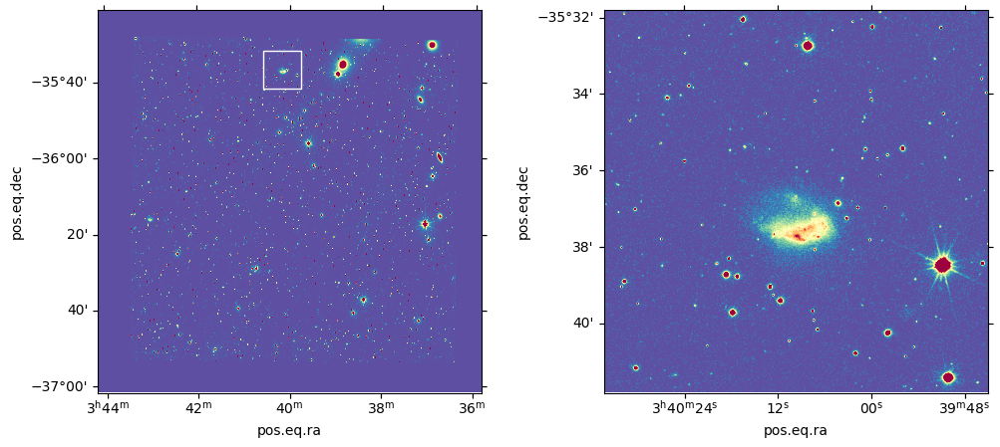

In [2]:
#########################
# Create the Field cutout
#########################
field__yx = fits.getdata(filename, 1)
field_header = fits.getheader(filename, 1)
# World Coordinate System information
w = WCS(field_header)
# guess central pix coordinates
central_coord = SkyCoord(ra, dec, unit=unit)
# find cutout central pixels from central coordinate
xc, yc = w.world_to_pixel(central_coord)
# create Cutout2D using central pixels and size
size *= u.pixel
obj_cut = Cutout2D(field__yx, position=central_coord, size=size, wcs=w)

# Plot Field and Cutout
f = plt.figure()
f.set_size_inches(12, 5)
ax1 = f.add_subplot(1, 2, 1, projection=w)
ax2 = f.add_subplot(1, 2, 2, projection=obj_cut.wcs)
# plot entire field
ax1.imshow(field__yx, origin='lower', cmap='Spectral_r', vmin=0, vmax=2)
# plot cutout patches on original field axes
obj_cut.plot_on_original(ax=ax1, color='w')
# plot cutout zoom
ax2.imshow(obj_cut.data, origin='lower', cmap='Spectral_r', vmin=0, vmax=2)


Now we will create a **1094x1094** pixels **SCUBE** with the 12-bands 
images from **S-PLUS TILE SPLUS-s28s34** for the chosen cutout coordinates. 
We change from **1093** to **1094** pixels because if size is an odd number, 
the program will choose the closest even integer. Feel free to reallocate 
the central pixel as you wish.

``scubes`` is the entry-point console script that will create the IFS-like
3D cube with the S-PLUS data. It will download the 12-band stamps and 
calculate the fluxes and errors of each image. The images are zero-point 
calibrated based on the **S-PLUS iDR4** (*scubes package includes zp data*) 
values, but they are **not corrected for Galactic extinction**. The 
resultant files will be created at directory *workdir*.

``scubes`` entry-point script help and usage:

In [3]:
!scubes --help

usage: scubes [-h] [-r] [-c] [-f] [-b BANDS [BANDS ...]] [-l SIZE] [-N]
              [-w WORK_DIR] [-o OUTPUT_DIR] [-x SEXTRACTOR] [-p CLASS_STAR]
              [-v] [-D] [-S SATUR_LEVEL] [-Z ZPCORR_DIR] [-z ZP_TABLE]
              [-B BACK_SIZE] [-T DETECT_THRESH] [-U USERNAME] [-P PASSWORD]
              [-M] [-I] [-F] [-R] [--version]
              SPLUS_TILE RA DEC GALAXY_NAME

┌─┐   ┌─┐┬ ┬┌┐ ┌─┐┌─┐  | Create S-PLUS galaxies data cubes, a.k.a. S-CUBES. 
└─┐───│  │ │├┴┐├┤ └─┐  | S-CUBES is an organized FITS file with data, errors, 
└─┘   └─┘└─┘└─┘└─┘└─┘  | mask and metadata about some galaxy present on any 
---------------------- + S-PLUS observed tile. Any problem contact:

   Eduardo Alberto Duarte Lacerda <dhubax@gmail.com>, Fabio Herpich <fabiorafaelh@gmail.com>

The input values of RA and DEC will be converted to degrees using the 
scubes.utilities.io.convert_coord_to_degrees(). All scripts with RA 
and DEC inputs parse angles in two different units:

- **hourangle**: using *h

The call to the entry-point script ``scubes`` to this example would be:

*Do not forget to change YOURUSER and YOURPASS for your credentials at S-PLUS Cloud.*

In [4]:
!scubes -frR -w . -U YOURUSER -P YOURPASS -l 1094 -- SPLUS-s28s34 55.04056625865023 -35.61345430143036 workshopgal

workshopgal @ SPLUS-s28s34 - downloading: 100%|█| 12/12 [00:13<00:00,  1.13s/it]
[2024-09-26T15:21:07.459669] - scubes: Reading ZPs table: /home/lacerda/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/data/iDR4_zero-points.csv
[2024-09-26T15:21:07.466222] - scubes: Getting ZP corrections for the S-PLUS bands...
[2024-09-26T15:21:07.470791] - scubes: Calibrating stamps...
/home/lacerda/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/core.py:603: RuntimeWarning: divide by zero encountered in divide
  dataerr__byx = np.sqrt(1/weidata__byx + dataclip__byx/gain__byx)
/home/lacerda/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/core.py:522: RuntimeWarning: cdelt will be ignored since cd is present
  nw.wcs.cdelt[:2] = w.wcs.cdelt
[2024-09-26T15:21:10.355442] - scubes: Cube successfully created!
[2024-09-26T15:21:10.355463] - scubes: Removing downloaded data


How to read a cube
------------------

A cube resultant from ``scubes`` script is stored using FITS format 
and is called **SCUBE**. In order to help the *user*, ``scubes`` 
package implements a utility class to read the **SCUBE**. This class
implements the method ``lRGB_image()`` to create Lupton RGB images.

Below an example of the ``scubes.utilities.read_scube()`` usage:

In [5]:
from os.path import join
from scubes.utilities.readscube import read_scube

SNAME = f'workshopgal'
filename = join(SNAME, f'{SNAME}_cube.fits')

scube = read_scube(filename)

/home/lacerda/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/utilities/readscube.py:373: RuntimeWarning: divide by zero encountered in log10
  self.mag_arcsec2__lyx = -2.5*np.log10(x)
/home/lacerda/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/utilities/readscube.py:373: RuntimeWarning: invalid value encountered in log10
  self.mag_arcsec2__lyx = -2.5*np.log10(x)
/home/lacerda/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/utilities/readscube.py:374: RuntimeWarning: divide by zero encountered in divide
  self.emag_arcsec2__lyx = (2.5*np.log10(np.exp(1)))*self.eflux__lyx/self.flux__lyx


Headers
-------

The *PRIMARY HEADER* (``scube.primary_header``) contains information 
about the object, all processed by the code. The *DATA HEADER* 
(``scube.data_header``) otherwise, includes information about the
tile observation and a 3D World Coordinate System (WCS) information, which 
is converted to a 2D ``astropy.wcs.WCS()`` instance in the variable 
``scube.wcs``. 

In [6]:
scube.primary_header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T                                                  
TILE    = 'SPLUS-s28s34'                                                        
GALAXY  = 'workshopgal'                                                         
SIZE    =                 1094 / Side of the stamp in pixels                    
X0TILE  =             5284.627                                                  
Y0TILE  =             9281.515                                                  
RA      =    55.04056625865023                                                  
DEC     =   -35.61345430143036                                                  

In [7]:
scube.data_header

XTENSION= 'IMAGE   '           / Image extension                                
BITPIX  =                  -64 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 1094                                                  
NAXIS2  =                 1094                                                  
NAXIS3  =                   12                                                  
PCOUNT  =                    0 / number of parameters                           
GCOUNT  =                    1 / number of groups                               
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
EQUINOX =        2000.00000000 / Mean equinox                                   
MJD-OBS =   5.841000000000E+04 / [d] MJD of observation                         
RADESYS = 'ICRS    '        

2D WCS instance:

In [8]:
scube.wcs

/home/lacerda/.pyenv/versions/dev/lib/python3.12/site-packages/astropy/wcs/wcs.py:3122: RuntimeWarning: cdelt will be ignored since cd is present
  description.append(s.format(*self.wcs.cdelt))


WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN' 'DEC--TAN' 
CRVAL : 55.0 -36.1910966111 
CRPIX : 764.5 -3232.5 
PC1_1 PC1_2  : -0.0001527777777778 0.0 
PC2_1 PC2_2  : 0.0 0.0001527777777778 
CDELT : 1.0 1.0 
NAXIS : 1094  1094  12

Filters information
-------------------

``scubes`` includes some information about the filters used to obtain
S-PLUS images. The script is called ``scubes_filters`` and the data
is obtained from [S-PLUS Filters Transmission Curve Calculator](https://github.com/splus-collab/splus_filters>),
made by Fabio Herpich.

In [9]:
!scubes_filters --decimals 2

filter central_wave delta_wave trapz_wave trapz_width mean_wave mean_width mean_1_wave mean_1_width pivot_wave alambda_av
------ ------------ ---------- ---------- ----------- --------- ---------- ----------- ------------ ---------- ----------
 uJAVA      3576.59     324.89    3542.14      322.83   3542.14     322.83     3541.97       322.48    3533.28       1.61
 J0378      3770.67     150.99    3774.01      135.96   3774.01     135.96     3773.98       135.75    3773.16       1.52
 J0395      3940.67      102.8    3941.09      100.78   3941.09     100.78     3941.07       100.66     3940.7       1.46
 J0410      4094.08     200.31    4096.24      193.35   4096.24     193.35     4096.21       193.12    4094.93        1.4
 J0430      4292.02     200.16    4293.38      195.07   4293.38     195.07     4293.34       194.82    4292.11       1.33
 gSDSS      4774.03    1505.46     4821.1     1312.44    4821.1    1312.44     4821.07      1312.17    4758.49        1.2
 J0515      5132.82     

The class ``scube`` also makes available some information about the 
filters, such as:

    scube.filters: filters names
    scube.pivot_wave: pivot wavelenghts
    scube.central_wave: central wavelenghts
    

In [10]:
for _f, _p, _c in zip(scube.filters, scube.pivot_wave, scube.central_wave):
    print(f'filter: {_f} wave(pivot, central): ({_p:.2f}, {_c:.2f})')

filter: uJAVA wave(pivot, central): (3533.28, 3576.59)
filter: J0378 wave(pivot, central): (3773.16, 3770.67)
filter: J0395 wave(pivot, central): (3940.70, 3940.67)
filter: J0410 wave(pivot, central): (4094.93, 4094.08)
filter: J0430 wave(pivot, central): (4292.11, 4292.02)
filter: gSDSS wave(pivot, central): (4758.49, 4774.03)
filter: J0515 wave(pivot, central): (5133.13, 5132.82)
filter: rSDSS wave(pivot, central): (6251.83, 6274.74)
filter: J0660 wave(pivot, central): (6613.88, 6613.99)
filter: iSDSS wave(pivot, central): (7670.61, 7702.50)
filter: J0861 wave(pivot, central): (8607.25, 8611.48)
filter: zSDSS wave(pivot, central): (8941.48, 8881.70)


More metadata about the **SCUBE** cube, such as the *exposure times, 
gains, PSF FWHM and the date of the observation* can be found with 
``scube.metadata``:

In [11]:
scube.metadata

FITS_rec([('uJAVA', 3576.5900319 , 3533.28150603, 676.59903929, 648.92014483, 1.99119794, '2018-10-19'),
          ('J0378', 3770.66765668, 3773.16495619, 658.74676176, 632.26328791, 1.70064406, '2018-10-19'),
          ('J0395', 3940.66900669, 3940.69812172, 352.93756056, 338.7962555 , 1.75043552, '2018-10-19'),
          ('J0410', 4094.0795908 , 4094.92800733, 175.28071781, 168.20639971, 1.78329256, '2018-10-19'),
          ('J0430', 4292.0201202 , 4292.10579006, 170.17338223, 163.37963129, 1.8630095 , '2018-10-19'),
          ('gSDSS', 4774.02604026, 4758.4878587 ,  98.18193687,  94.23149525, 1.87734807, '2018-10-19'),
          ('J0515', 5132.82097321, 5133.13247975, 181.75628181, 174.42013249, 1.80799854, '2018-10-19'),
          ('rSDSS', 6274.74334743, 6251.83097429, 119.62855652, 114.81915103, 1.640342  , '2018-10-19'),
          ('J0660', 6613.99318993, 6613.87556039, 867.32867478, 829.12140756, 1.72156602, '2018-10-19'),
          ('iSDSS', 7702.49932499, 7670.61445983, 137.1

Images plot
-----------

This example below plots the images of the magnitudes and errors from 
all filters, calculated by ``scubes`` package. The of the flux and errors
by default are in erg/s/$\AA$/cm$^2$:

    scube.flux__lyx and scube.eflux__lyx

the `lyx` suffix points the dimensions of the array (Lambda, Y, X).
``scube`` class also create arrays with the value converted to 
mag/arcsec/pix$^2$:

    scube.mag__lyx and scube.emag__lyx


In [12]:
import numpy as np
import matplotlib.ticker as ticker

Text(0.5, 0.98, 'mag/arcsec/pix$^2$')

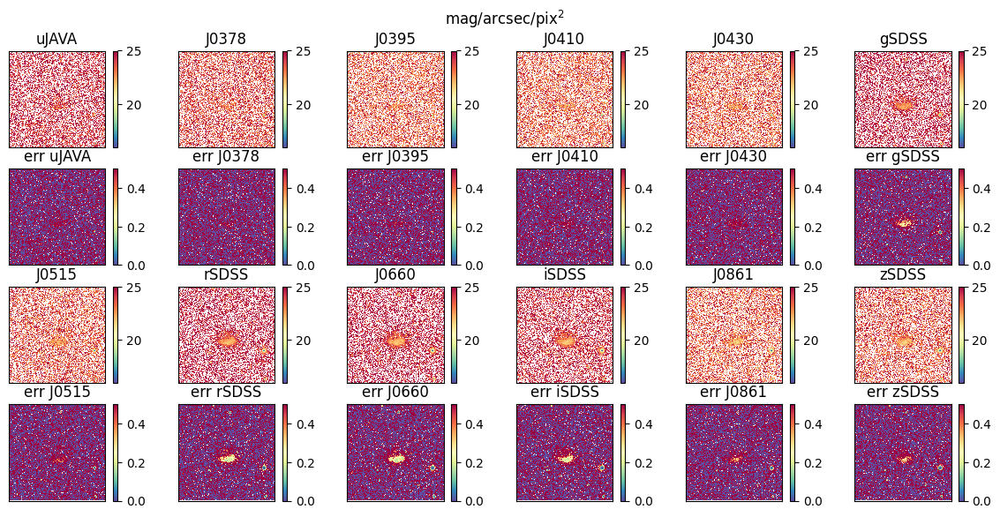

In [13]:
f__byx = scube.mag__lyx
ef__byx = scube.emag__lyx
weimask__yx = scube.weimask__yx
filters_names = scube.metadata['FILTER']
nb, ny, nx = f__byx.shape
nrows = 2
ncols = int(nb/nrows)
f, ax_arr = plt.subplots(2*nrows, ncols)
f.set_size_inches(12, 6)
f.subplots_adjust(left=0.01, right=0.95, bottom=0.05, top=0.90, hspace=0.22, wspace=0.13)
k = 0
for ir in range(nrows):
    for ic in range(ncols):
        img = f__byx[k]
        vmin, vmax = 16, 25
        ax = ax_arr[ir*2, ic]
        ax.set_title(filters_names[k])
        im = ax.imshow(img, origin='lower', cmap='Spectral_r', vmin=vmin, vmax=vmax, interpolation='nearest')
        plt.colorbar(im, ax=ax)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.yaxis.set_major_locator(ticker.NullLocator())

        eimg = ef__byx[k]
        vmin, vmax = 0, 0.5
        ax = ax_arr[ir*2 + 1, ic]
        ax.set_title(f'err {filters_names[k]}')
        im = ax.imshow(eimg, origin='lower', cmap='Spectral_r', vmin=vmin, vmax=vmax, interpolation='nearest')
        plt.colorbar(im, ax=ax)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.yaxis.set_major_locator(ticker.NullLocator())

        k += 1
f.suptitle(r'mag/arcsec/pix$^2$')

Text(0.5, 0.98, '$\\log_{10}$ 10$^{18}$erg/s/$\\AA$/cm$^2$')

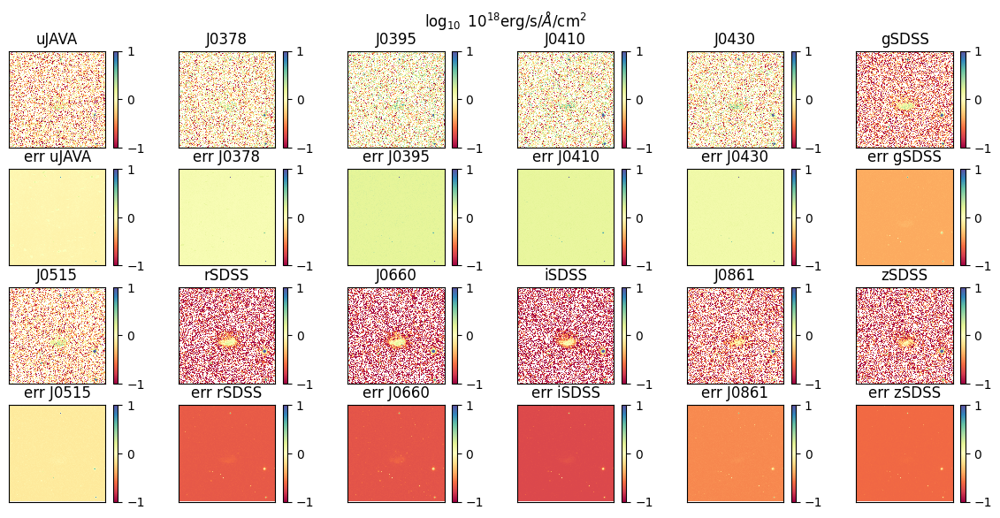

In [14]:
f__byx = np.ma.log10(scube.flux__lyx) + 18
ef__byx = np.ma.log10(scube.eflux__lyx) + 18
weimask__yx = scube.weimask__yx
filters_names = scube.metadata['FILTER']
nb, ny, nx = f__byx.shape
nrows = 2
ncols = int(nb/nrows)
f, ax_arr = plt.subplots(2*nrows, ncols)
f.set_size_inches(12, 6)
f.subplots_adjust(left=0.01, right=0.95, bottom=0.05, top=0.90, hspace=0.22, wspace=0.13)
k = 0
for ir in range(nrows):
    for ic in range(ncols):
        img = f__byx[k]
        vmin, vmax = np.percentile(img.compressed(), [5, 95])
        vmin, vmax = -1, 1
        ax = ax_arr[ir*2, ic]
        ax.set_title(filters_names[k])
        im = ax.imshow(img, origin='lower', cmap='Spectral', vmin=vmin, vmax=vmax, interpolation='nearest')
        plt.colorbar(im, ax=ax)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.yaxis.set_major_locator(ticker.NullLocator())
        eimg = ef__byx[k]
        vmin, vmax = np.percentile(eimg.compressed(), [5, 95])
        vmin, vmax = -1, 1
        ax = ax_arr[ir*2 + 1, ic]
        ax.set_title(f'err {filters_names[k]}')
        im = ax.imshow(eimg, origin='lower', cmap='Spectral', vmin=vmin, vmax=vmax, interpolation='nearest')
        plt.colorbar(im, ax=ax)
        ax.xaxis.set_major_locator(ticker.NullLocator())
        ax.yaxis.set_major_locator(ticker.NullLocator())

        k += 1
f.suptitle(r'$\log_{10}$ 10$^{18}$erg/s/$\AA$/cm$^2$')

3D image
--------

FOV: 140.0 deg
focal lenght: 0.36397023426620245


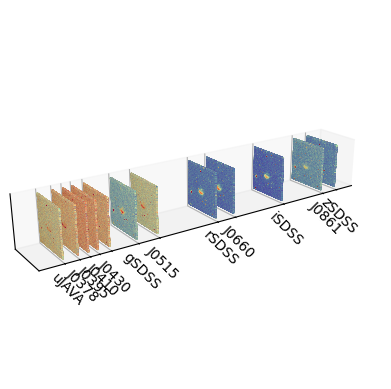

In [15]:
xx, yy = np.meshgrid(range(scube.size), range(scube.size))
FOV = 140*u.deg
focal_lenght = 1/np.tan(FOV/2)
print(f'FOV: {FOV}\nfocal lenght: {focal_lenght}')
f = plt.figure()
ax = f.add_subplot(projection='3d')
for i, _w in enumerate(scube.pivot_wave):
    sc = ax.scatter(xx, yy, c=np.ma.log10(scube.flux__lyx[i]) + 18, 
                    zs=_w, s=1, edgecolor='none', vmin=-1, vmax=0.5, cmap='Spectral_r')
ax.set_zticks(scube.pivot_wave)
ax.set_zticklabels(scube.filters, rotation=-45)
ax.set_proj_type('persp', focal_length=focal_lenght)
ax.set_box_aspect(aspect=(7, 1, 1))
ax.view_init(elev=20, azim=-125, vertical_axis='y')
ax.set_xticks([])
ax.set_yticks([])
for spine in ax.spines.values():
    spine.set_visible(False)

RGB and Filters plot
--------------------

This series of examples below are using the Lupton RGB method of the 
``scube`` module and some of the **data** stored by the ``scubes`` 
package in order to create a filters transmittance plot.

``scubes`` package implements various constants in ``scubes.constants``
module. This example below uses ``FILTER_NAMES_FITS``, ``FILTERS_COLORS`` 
and ``FILTER_TRANSMITTANCE`` data. The filters transmittance curves are 
calculated by ``splus-filters`` package:

* https://github.com/splus-collab/splus_filters

The ``scubes.utilities.read_scube.lRGB_image`` is a wrapper to 
``astropy.visualization.make_lupton_rgb()`` that creates RGB images 
using the **SCUBE** instantiated by ``scubes.utilities.read_scube``
class.

Text(0.5, 1.0, 'new_B=2B')

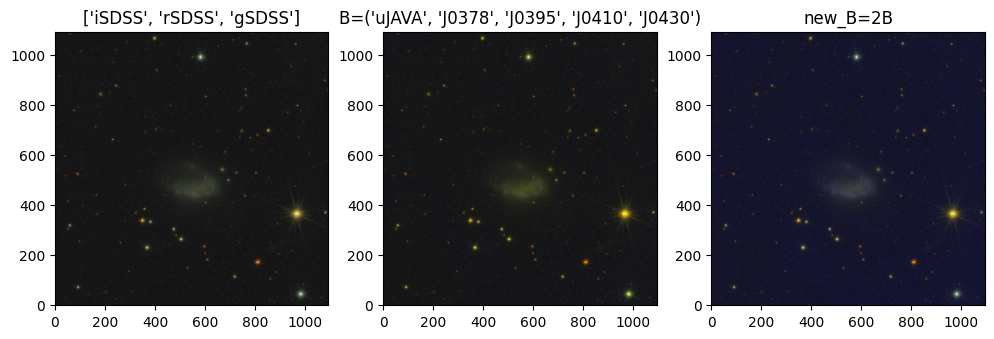

In [16]:
# RGB plot
rgb_f = [1, 1, 1]
pminmax = [5, 95]
Q = 10
stretch = 5
im_max = 1
minimum = (0, 0, 0)

f, axArr = plt.subplots(1, 3)
ax1, ax2, ax3 = axArr
f.set_size_inches(12, 4)

###### original RGB from splus.data package
rgb = ['iSDSS', 'rSDSS', 'gSDSS']
rgb__yxb = scube.lRGB_image(rgb, rgb_f, pminmax, Q=Q, stretch=stretch, im_max=im_max, minimum=minimum)
ax1.imshow(rgb__yxb, origin='lower')
ax1.set_title(rgb)

###### improved RGB
R_filters = 'iSDSS'
G_filters = 'rSDSS'
B_filters = tuple(scube.filters[0:5])
rgb = [R_filters, G_filters, B_filters]
rgb__yxb = scube.lRGB_image(rgb, rgb_f, pminmax, Q=Q, stretch=stretch, im_max=im_max, minimum=minimum)
ax2.imshow(rgb__yxb, origin='lower')
ax2.set_title(f'B={B_filters}')

###### improved RGB with contrast
rgb_f = [1, 1, 2]
R_filters = 'iSDSS'
G_filters = 'rSDSS'
B_filters = tuple(scube.filters[0:5])
rgb = [R_filters, G_filters, B_filters]
rgb__yxb = scube.lRGB_image(rgb, rgb_f, pminmax, Q=Q, stretch=stretch, im_max=im_max, minimum=minimum)
ax3.imshow(rgb__yxb, origin='lower')
ax3.set_title('new_B=2B')

Text(0, 0.5, '${\\rm R}_\\lambda\\ [\\%]$')

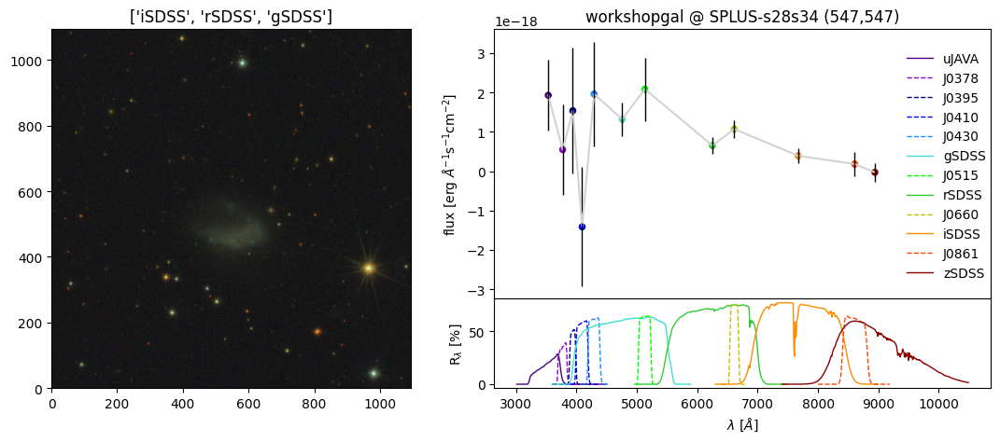

In [17]:
from matplotlib.gridspec import GridSpec

from scubes.constants import FILTER_NAMES_FITS, FILTER_COLORS, FILTER_TRANSMITTANCE

# central coords
i_x0, i_y0 = scube.i_x0, scube.i_y0
spec_pix_y, spec_pix_x = i_y0, i_x0

# data
logflux__l = np.ma.log10(scube.flux__lyx[:, i_y0, i_x0])  #.sum(axis=(1, 2)))
logeflux__l = np.ma.log10(scube.eflux__lyx[:, i_y0, i_x0])
flux__l = scube.flux__lyx[:, i_y0, i_x0]
eflux__l = scube.eflux__lyx[:, i_y0, i_x0]
bands__l = scube.pivot_wave

# plot
nrows = 4
ncols = 2
f = plt.figure()
f.set_size_inches(12, 5)
f.subplots_adjust(left=0, right=0.9)
gs = GridSpec(nrows=nrows, ncols=ncols, hspace=0, wspace=0.03, figure=f)
ax = f.add_subplot(gs[0:nrows - 1, 1])
axf = f.add_subplot(gs[-1, 1])
axrgb = f.add_subplot(gs[:, 0])

# RGB image
rgb = ['iSDSS', 'rSDSS', 'gSDSS']
rgb__yxb = scube.lRGB_image(
    rgb=rgb, rgb_f=[1, 1, 1], 
    pminmax=[5, 95], Q=10, stretch=5, im_max=1, minimum=(0, 0, 0)
)
axrgb.imshow(rgb__yxb, origin='lower')
axrgb.set_title(rgb)

# filters transmittance
filter_colors = []
axf.sharex(ax)
for k in scube.filters:
    _f = FILTER_TRANSMITTANCE[k]
    c = FILTER_COLORS[FILTER_NAMES_FITS[k]]
    filter_colors.append(c)
    lt = '--'
    if 'JAVA' in k or 'SDSS' in k:
        lt = '-'
    axf.plot(_f['wavelength'], _f['transmittance'], c=c, lw=1, ls=lt, label=k)
axf.legend(loc=(0.82, 1.15), frameon=False)

# spectrum 
ax.set_title(f'{scube.galaxy} @ {scube.tile} ({spec_pix_x},{spec_pix_y})')
ax.errorbar(x=bands__l,y=flux__l, yerr=eflux__l, c='k', lw=1, fmt='|')
ax.plot(bands__l, flux__l, '-', c='lightgray')
ax.scatter(bands__l, flux__l, c=np.array(filter_colors), s=20)

ax.set_xlabel(r'$\lambda_{\rm pivot}\ [\AA]$', fontsize=10)
ax.set_ylabel(r'flux $[{\rm erg}\ \AA^{-1}{\rm s}^{-1}{\rm cm}^{-2}]$', fontsize=10)
axf.set_xlabel(r'$\lambda\ [\AA]$', fontsize=10)
axf.set_ylabel(r'${\rm R}_\lambda\ [\%]$', fontsize=10)

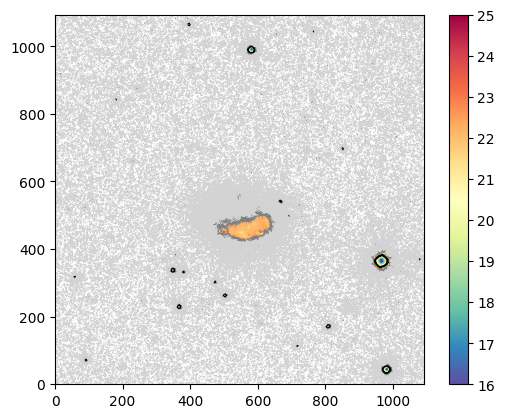

In [18]:
# Contour plot example
i_lambda = scube.filters.index('rSDSS')
image__yx = scube.mag__lyx[i_lambda]
contour_levels = [21, 23, 24]

f = plt.figure()
im = plt.imshow(image__yx, cmap='Spectral_r', origin='lower', vmin=16, vmax=25)
plt.contour(image__yx, levels=[21, 23, 24], colors=['k', 'gray', 'lightgray'])
plt.colorbar(im)

Distance from center
--------------------

With ``scube.pixel_distance__yx`` property, the user also can play with
distance masks, such as create integrated spectra. An example:

Text(0.5, 1.0, 'int. area. spectrum')

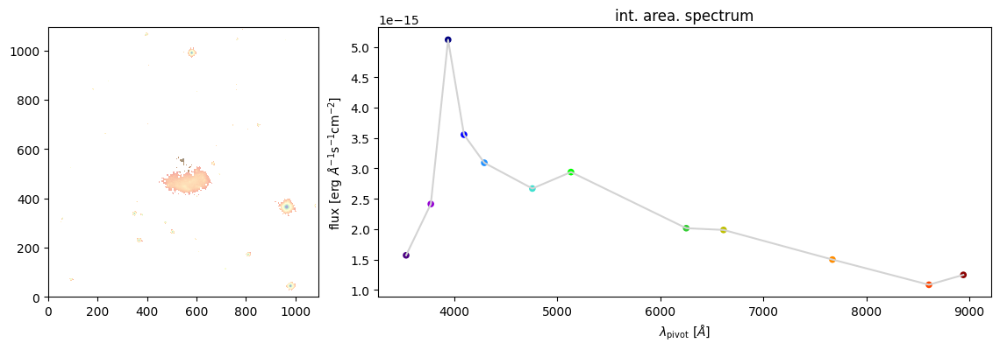

In [19]:
from matplotlib.gridspec import GridSpec

max_dist = 50  # pixels
mask__yx = scube.pixel_distance__yx > max_dist
__lyx = (scube.n_filters, scube.n_y, scube.n_x)
mask__lyx = np.broadcast_to(mask__yx, __lyx)
integrated_flux__lyx = np.ma.masked_array(scube.flux__lyx, mask=mask__lyx, copy=True)

f = plt.figure()
f.set_size_inches(12, 4)
f.subplots_adjust(left=0, right=0.9)
gs = GridSpec(nrows=1, ncols=3, wspace=0.2, figure=f)
ax = f.add_subplot(gs[1:])
axmask = f.add_subplot(gs[0])
img__yx = np.ma.masked_array(scube.mag__lyx[scube.filters.index('rSDSS')], mask=mask__yx, copy=True)
im = axmask.imshow(img__yx, origin='lower', cmap='Spectral_r')
axmask.imshow(scube.mag__lyx[scube.filters.index('rSDSS')], origin='lower', cmap='Spectral_r', alpha=0.5, vmin=16, vmax=25)
bands__l = scube.pivot_wave
flux__l = integrated_flux__lyx.sum(axis=(1,2))
ax.plot(bands__l, flux__l, '-', c='lightgray')
ax.scatter(bands__l, flux__l, c=np.array(filter_colors), s=20, label='')
ax.set_xlabel(r'$\lambda_{\rm pivot}\ [\AA]$', fontsize=10)
ax.set_ylabel(r'flux $[{\rm erg}\ \AA^{-1}{\rm s}^{-1}{\rm cm}^{-2}]$', fontsize=10)
ax.set_title('int. area. spectrum')

plots module
------------

S-Cubes have an entire object dedicated to plot data from a **SCUBE**.
Together, implements a console script called ``splots`` to create a suit 
of plots of a **SCUBE**.

Let's use the module version: ``scubes.utilities.plots.scube_plots``.

> ``scube_plots`` instantiates a ``read_scube`` object at the property ``scube``

In [20]:
from scubes.utilities.plots import scube_plots

splots = scube_plots(filename)

/home/lacerda/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/utilities/readscube.py:373: RuntimeWarning: divide by zero encountered in log10
  self.mag_arcsec2__lyx = -2.5*np.log10(x)
/home/lacerda/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/utilities/readscube.py:373: RuntimeWarning: invalid value encountered in log10
  self.mag_arcsec2__lyx = -2.5*np.log10(x)
/home/lacerda/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/utilities/readscube.py:374: RuntimeWarning: divide by zero encountered in divide
  self.emag_arcsec2__lyx = (2.5*np.log10(np.exp(1)))*self.eflux__lyx/self.flux__lyx


In [21]:
print(type(splots.scube))
splots.scube.primary_header

<class 'scubes.utilities.readscube.read_scube'>


SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T                                                  
TILE    = 'SPLUS-s28s34'                                                        
GALAXY  = 'workshopgal'                                                         
SIZE    =                 1094 / Side of the stamp in pixels                    
X0TILE  =             5284.627                                                  
Y0TILE  =             9281.515                                                  
RA      =    55.04056625865023                                                  
DEC     =   -35.61345430143036                                                  

In [22]:
splots.images_flux_plot?

Signature: splots.images_flux_plot(output_filename=None, cmap='Spectral_r')
Docstring:
Plots flux images for each filter in the data cube in log scale.

Parameters
----------
output_filename : str, optional
    Path to save the output figure (default is None).

cmap : str, optional
    Colormap to use for the images (default is 'Spectral_r').
File:      ~/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/utilities/plots.py
Type:      method

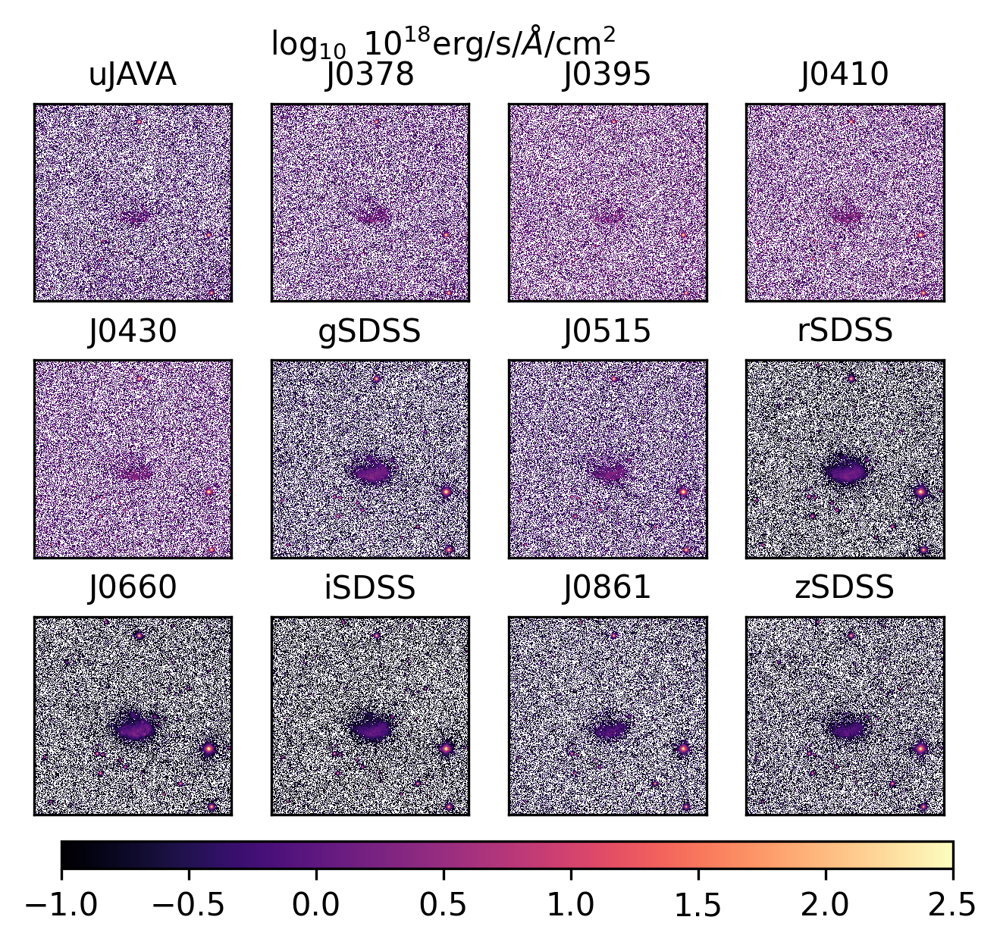

In [23]:
# Let's call PIL.Image module to display the output image
from PIL import Image

ofile = f'../../images/{SNAME}_flux.png'
splots.images_flux_plot(output_filename=ofile, cmap='magma')
display(Image.open(ofile))

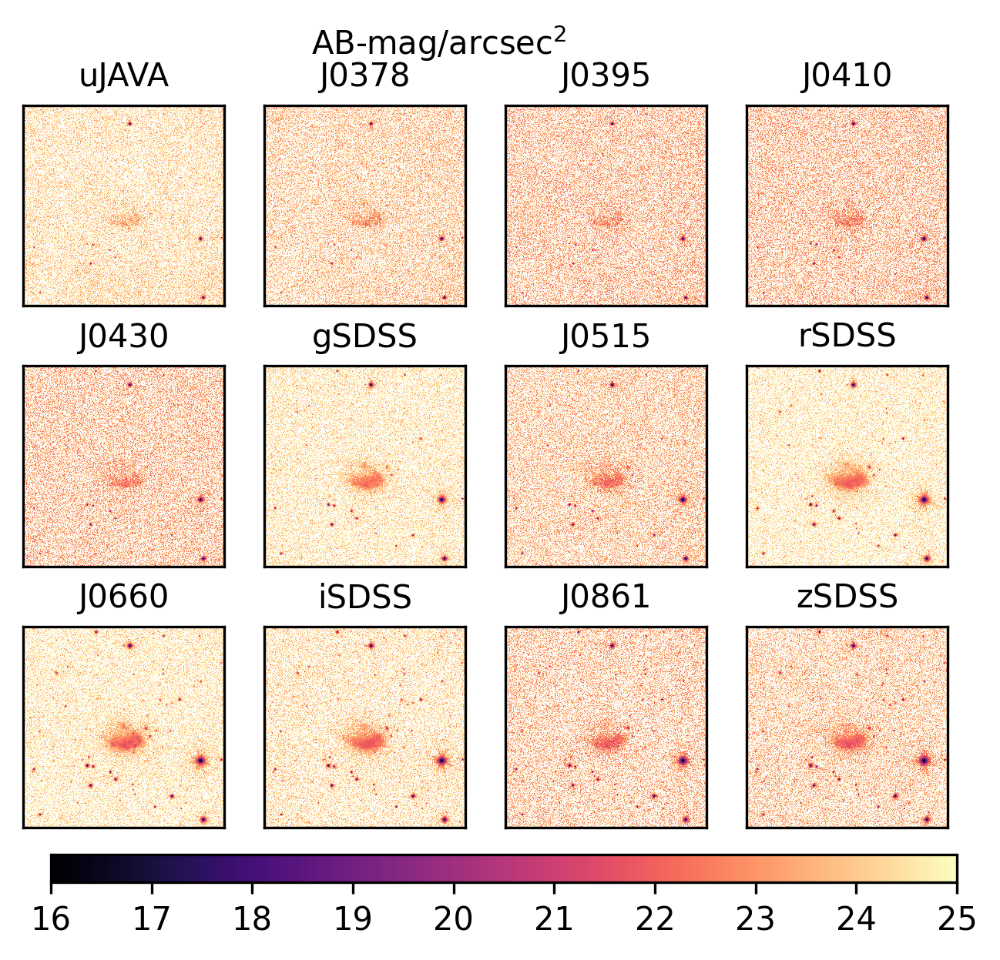

In [24]:
ofile = f'../../images/{SNAME}_mag.png'
splots.images_mag_plot(output_filename=ofile, cmap='magma')
display(Image.open(ofile))

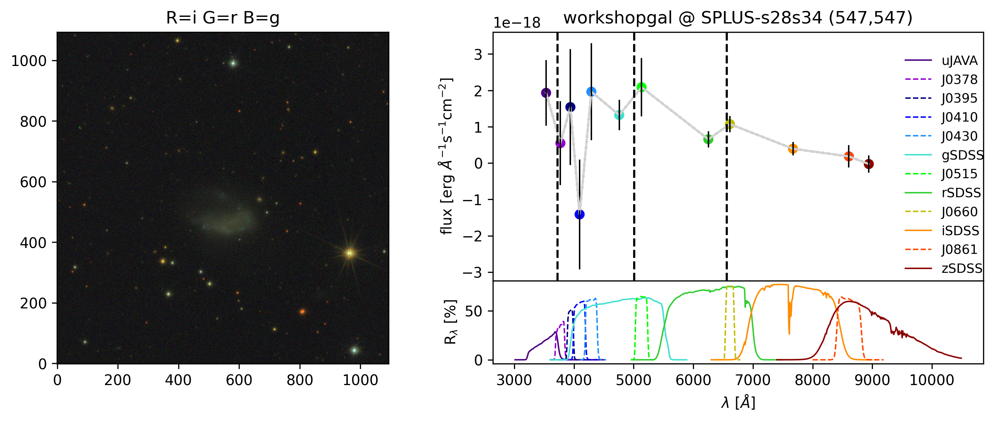

In [25]:
ofile = f'../../images/{SNAME}_RGBcentspec.png'
splots.LRGB_centspec_plot(output_filename=ofile)
display(Image.open(ofile))

As mentioned above, the class ``read_scube`` includes a method called ``lRGB_image`` to create RGB with the *SCUBE*:

In [26]:
# RGBs
splots.scube.lRGB_image?

Signature:
splots.scube.lRGB_image(
    rgb=('rSDSS', 'gSDSS', 'iSDSS'),
    rgb_f=(1, 1, 1),
    pminmax=(5, 95),
    im_max=255,
    minimum=(0, 0, 0),
    Q=0,
    stretch=10,
)
Docstring:
Creates an RGB image from the data cube using specified filters.

Parameters
----------
rgb : tuple of str, optional
    Tuple specifying the filters to use for the red, green, and blue channels (default is ('rSDSS', 'gSDSS', 'iSDSS')).

rgb_f : tuple of float, optional
    Scaling factors for the red, green, and blue channels (default is (1, 1, 1)).

pminmax : tuple of int, optional
    Percentiles for scaling the RGB intensities (default is (5, 95)).

im_max : int, optional
    Maximum intensity value for the RGB image (default is 255).

minimum : tuple of float, optional
    Minimum values for scaling the RGB channels (default is (0, 0, 0)).

Q : float, optional
    Parameter for controlling the contrast in the Lupton RGB scaling (default is 0).

stretch : float, optional
    Stretch factor for

``splots`` implements a wrapper of ``read_scube.lRGB_image`` method to plot the RGBs directly:

In [27]:
splots.LRGB_plot?

Signature: splots.LRGB_plot(output_filename=None, **kw_rgb)
Docstring:
Creates an LRGB image from the data cube.

Parameters
----------
output_filename : str, optional
    Path to save the output figure (default is None).

**kw_rgb : dict, optional
    Additional keyword arguments for controlling the LRGB image creation.
    See ``scubes.utilities.readscube.read_scubes.lRGB_image`` for help on 
    the arguments.
File:      ~/.pyenv/versions/dev/lib/python3.12/site-packages/scubes/utilities/plots.py
Type:      method

0 uJAVA
1 J0378
2 J0395
3 J0410
4 J0430
5 gSDSS
6 J0515
7 rSDSS
8 J0660
9 iSDSS
10 J0861
11 zSDSS


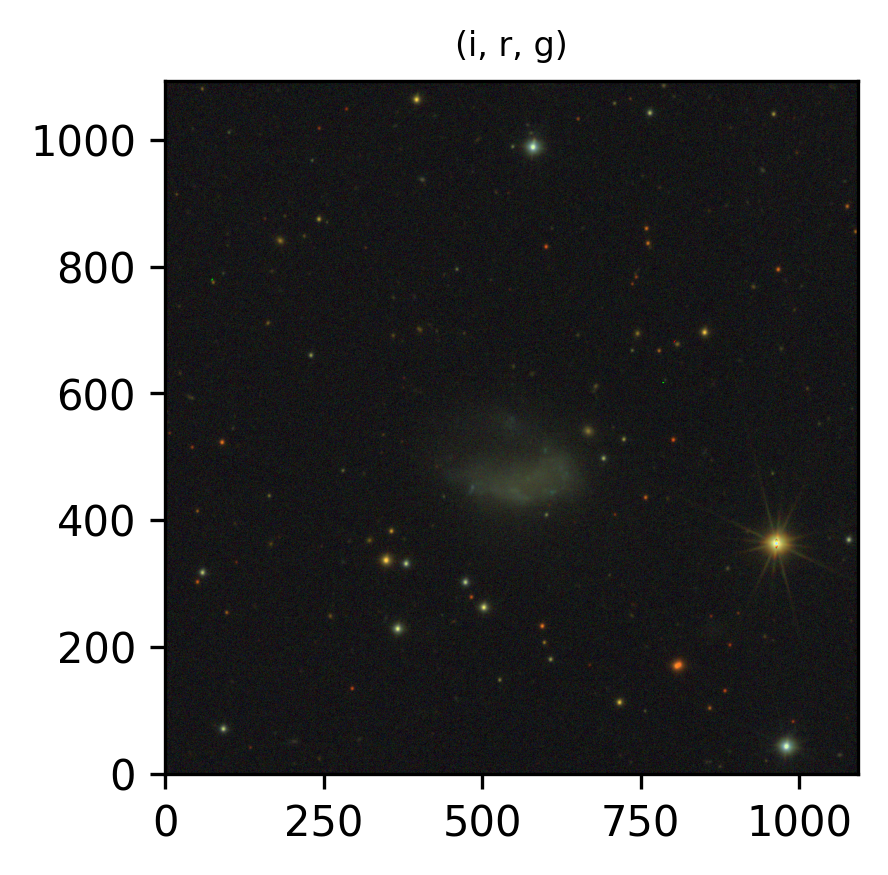

In [28]:
# use scube.filters index or name
for i, filt in enumerate(splots.scube.filters):
    print(i, filt)

ofile = f'../../images/{SNAME}_RGB_irg.png'
kw_rgb = dict(
    rgb=['iSDSS', 'rSDSS', 'gSDSS'],  # or [9, 7, 5]
)
kw_rgb['title'] = '(i, r, g)'
splots.LRGB_plot(output_filename=ofile, **kw_rgb)
display(Image.open(ofile))

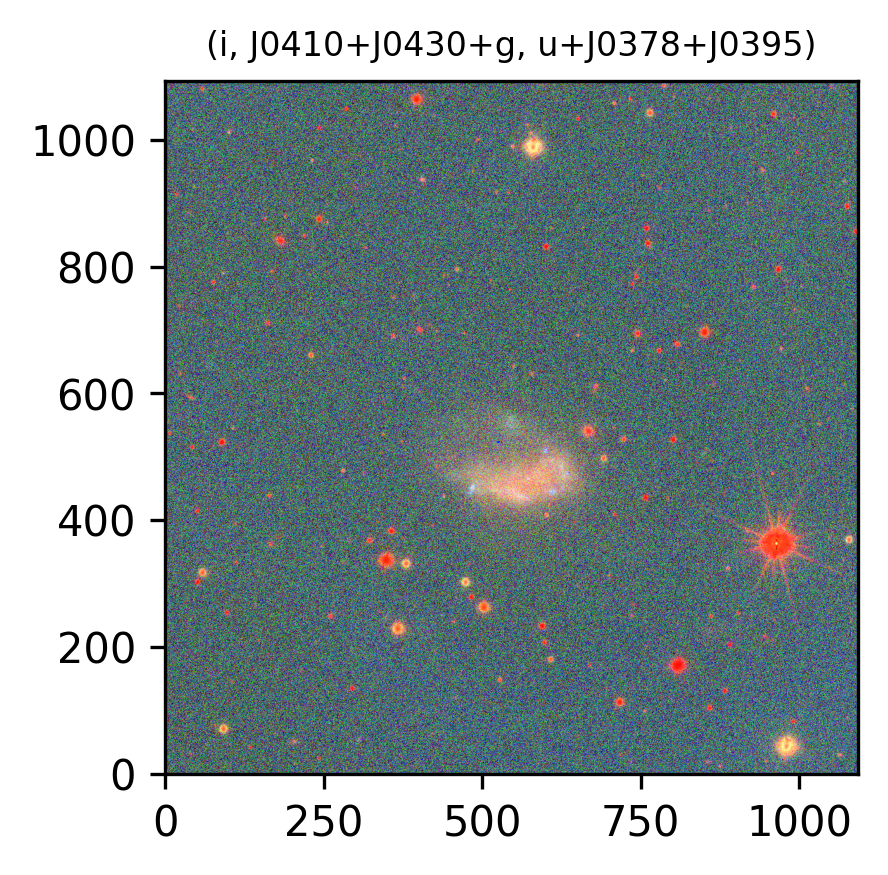

In [29]:
# You can also sum filters and tune the data and colors 
# to create different RGBs
ofile = f'../../images/{SNAME}_RGB_sumfilters.png'
kw_rgb = dict(
    rgb=[9, [3, 4, 5], [0, 1, 2]], # or ['iSDSS', ['J0410', 'J0430', 'gSDSS'], ['uJAVA', 'J0378', 'J0395']]
    pminmax=[1.5, 98.5],
    Q=3, stretch=130, im_max=180, 
    minimum=(15, 15, 15),
)
kw_rgb['title'] = '(i, J0410+J0430+g, u+J0378+J0395)'
splots.LRGB_plot(output_filename=ofile, **kw_rgb)
display(Image.open(ofile))